In [2]:
import pandas as pd

file_data = pd.read_json('News_Category_Dataset_v2.json', lines=True)
file_data.head()

,category,headline,authors,link,short_description,date
0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,Melissa Jeltsen,https://www.huffingtonpost.com/entry/texas-ama...,She left her husband. He killed their children...,2018-05-26
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Andy McDonald,https://www.huffingtonpost.com/entry/will-smit...,Of course it has a song.,2018-05-26
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,Ron Dicker,https://www.huffingtonpost.com/entry/hugh-gran...,The actor and his longtime girlfriend Anna Ebe...,2018-05-26
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,Ron Dicker,https://www.huffingtonpost.com/entry/jim-carre...,The actor gives Dems an ass-kicking for not fi...,2018-05-26
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,Ron Dicker,https://www.huffingtonpost.com/entry/julianna-...,"The ""Dietland"" actress said using the bags is ...",2018-05-26


In [3]:
file_data.shape

(200853, 6)

In [4]:
relevant_cols = file_data.drop(['authors', 'link', 'date'], axis='columns')
relevant_cols.head()

,category,headline,short_description
0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,She left her husband. He killed their children...
1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Of course it has a song.
2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,The actor and his longtime girlfriend Anna Ebe...
3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,The actor gives Dems an ass-kicking for not fi...
4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,"The ""Dietland"" actress said using the bags is ..."


In [5]:
relevant_cols.shape

(200853, 3)

In [6]:
categories = ['POLITICS', 'SPORTS', 'EDUCATION', 'WELLNESS', 'MONEY']
relevant_rows = relevant_cols[relevant_cols['category'].isin(categories)]
relevant_rows.tail()

,category,headline,short_description
200805,WELLNESS,This Is Only the Beginning: Surprising Advice ...,"My great-aunt Ida loves to say, ""This is only ..."
200849,SPORTS,Maria Sharapova Stunned By Victoria Azarenka I...,"Afterward, Azarenka, more effusive with the pr..."
200850,SPORTS,"Giants Over Patriots, Jets Over Colts Among M...","Leading up to Super Bowl XLVI, the most talked..."
200851,SPORTS,Aldon Smith Arrested: 49ers Linebacker Busted ...,CORRECTION: An earlier version of this story i...
200852,SPORTS,Dwight Howard Rips Teammates After Magic Loss ...,The five-time all-star center tore into his te...


In [7]:
relevant_rows.shape

(58161, 3)

In [8]:
# rename WELLNESS to HEALTHCARE and MONEY to FINANCE

df = relevant_rows
df['category'] = df['category'].replace(['WELLNESS', 'MONEY'], ['HEALTHCARE', 'FINANCE'])
df.tail()

<ipython-input-8-4db0a047c698>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['category'] = df['category'].replace(['WELLNESS', 'MONEY'], ['HEALTHCARE', 'FINANCE'])


,category,headline,short_description
200805,HEALTHCARE,This Is Only the Beginning: Surprising Advice ...,"My great-aunt Ida loves to say, ""This is only ..."
200849,SPORTS,Maria Sharapova Stunned By Victoria Azarenka I...,"Afterward, Azarenka, more effusive with the pr..."
200850,SPORTS,"Giants Over Patriots, Jets Over Colts Among M...","Leading up to Super Bowl XLVI, the most talked..."
200851,SPORTS,Aldon Smith Arrested: 49ers Linebacker Busted ...,CORRECTION: An earlier version of this story i...
200852,SPORTS,Dwight Howard Rips Teammates After Magic Loss ...,The five-time all-star center tore into his te...


In [9]:
df.shape

(58161, 3)

# NBC

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline

text_clf = Pipeline([('vector', TfidfVectorizer()), ('clf', MultinomialNB())])



In [11]:
x = df.drop('category', axis='columns')
y = df['category']

x.head()

,headline,short_description
13,Trump's Crackdown On Immigrant Parents Puts Mo...,Last month a Health and Human Services officia...
14,'Trump's Son Should Be Concerned': FBI Obtaine...,The wiretaps feature conversations between Ale...
15,Edward Snowden: There's No One Trump Loves Mor...,"But don't count on Robert Mueller to nail him,..."
16,Booyah: Obama Photographer Hilariously Trolls ...,Just a peeping minute.
17,Ireland Votes To Repeal Abortion Amendment In ...,Irish women will no longer have to travel to t...


In [12]:
y.head()

13    POLITICS
14    POLITICS
15    POLITICS
16    POLITICS
17    POLITICS
Name: category, dtype: object

### Train Test split

In [13]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

x_train.shape

(46528, 2)

In [14]:
x_test.shape

(11633, 2)

In [15]:
import time

# train the model
start_time = time.time() 
text_clf.fit(x_train['headline'], y_train)
print("Training time(in seconds)", time.time() - start_time)

# test the model
predicted = text_clf.predict(x_test['headline'])

Training time(in seconds) 0.798926591873169


### Metrics

In [16]:
from sklearn import metrics
from sklearn.metrics import accuracy_score

print(accuracy_score(y_test, predicted))


metrics.confusion_matrix(y_test, predicted)

0.847502793776326


array([[   0,    0,   40,  159,    0],
       [   0,    3,   89,  246,    1],
       [   0,    0, 3093,  532,    3],
       [   0,    0,  110, 6413,    2],
       [   0,    0,   84,  508,  350]], dtype=int64)

In [17]:
metrics.confusion_matrix(y_test, predicted)

array([[   0,    0,   40,  159,    0],
       [   0,    3,   89,  246,    1],
       [   0,    0, 3093,  532,    3],
       [   0,    0,  110, 6413,    2],
       [   0,    0,   84,  508,  350]], dtype=int64)

In [18]:
print(metrics.classification_report(y_test, predicted))

              precision    recall  f1-score   support

   EDUCATION       0.00      0.00      0.00       199
     FINANCE       1.00      0.01      0.02       339
  HEALTHCARE       0.91      0.85      0.88      3628
    POLITICS       0.82      0.98      0.89      6525
      SPORTS       0.98      0.37      0.54       942

    accuracy                           0.85     11633
   macro avg       0.74      0.44      0.47     11633
weighted avg       0.85      0.85      0.82     11633

C:\Users\bhava\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\bhava\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-

In [19]:
sample_prediction = text_clf.predict(['10 ways to beat stress in 10 minutes or less'])
sample_prediction

array(['HEALTHCARE'], dtype='<U10')

# SVM

In [27]:
education = df[df.category == 'EDUCATION']
print(education.head())
finance = df[df.category == 'FINANCE']
print(finance.head())
healthcare = df[df.category == 'HEALTHCARE']
print(healthcare.head())
politics = df[df.category == 'POLITICS']
print(politics.head())
sports = df[df.category == 'SPORTS']
sports.head()

       category                                           headline  \
443   EDUCATION  The Controversial Way Some California Schools ...   
1255  EDUCATION  California School First In The Nation To Be Di...   
1346  EDUCATION  States Are Favoring School Choice At A Steep C...   
1380  EDUCATION  Girls Reportedly Bleeding Through Pants Due To...   
1978  EDUCATION  Desperate For Teachers, Districts Beg Retirees...   

                                      short_description  
443   By David Washburn The two 9th-grade girls hear...  
1255  By David Washburn Among the many disturbing tr...  
1346  The current debate over school funding must mo...  
1380  The school system is now allowing girls to tie...  
1978  "It’s difficult not to respond when you hear t...  
       category                                           headline  \
125035  FINANCE  Stop Hating, Millennials Spend Tax Refunds (an...   
125097  FINANCE             3 Things Wealthy People Do Differently   
125102  FINANCE      

,category,headline,short_description
80,SPORTS,Jets Chairman Christopher Johnson Won't Fine P...,“I never want to put restrictions on the speec...
101,SPORTS,Trump Posthumously Pardons Boxer Jack Johnson,The pardoning of the black heavyweight boxer i...
135,SPORTS,Anna Kournikova Dancing With Her Bouncing Baby...,The score is love-love.
136,SPORTS,Trump Says NFL Players Unwilling To Stand For ...,"""I don’t think people should be staying in loc..."
154,SPORTS,Brandi Chastain Totally Agrees Her Hall Of Fam...,Was it supposed to be Gary Busey or Mickey Roo...


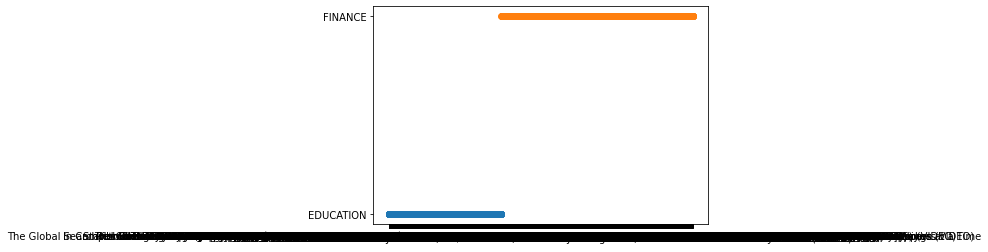

In [30]:
from matplotlib import pyplot as plt

plt.scatter(education['headline'], education['category'])
plt.scatter(finance['headline'], finance['category'])
plt.show()

In [21]:
from sklearn.svm import SVC

model = Pipeline([('vect', TfidfVectorizer()), ('svm', SVC(kernel='linear'))])

start_time = time.time() 
model.fit(x_train['headline'], y_train)
print("Training time(in seconds)", time.time() - start_time)

Training time(in seconds) 255.98563933372498


In [23]:
model.score(x_test['headline'], y_test)

0.9088799105991575

In [24]:
from sklearn import metrics

y_pred = model.predict(x_test['headline'])
print(metrics.classification_report(y_test, y_pred))
metrics.confusion_matrix(y_test, y_pred)

              precision    recall  f1-score   support

   EDUCATION       0.69      0.35      0.47       199
     FINANCE       0.80      0.52      0.63       339
  HEALTHCARE       0.89      0.93      0.91      3628
    POLITICS       0.93      0.95      0.94      6525
      SPORTS       0.90      0.81      0.85       942

    accuracy                           0.91     11633
   macro avg       0.84      0.71      0.76     11633
weighted avg       0.91      0.91      0.91     11633



array([[  70,    3,   38,   84,    4],
       [   2,  177,   62,   92,    6],
       [  11,   19, 3372,  203,   23],
       [  18,   20,  240, 6194,   53],
       [   1,    1,   58,  122,  760]], dtype=int64)

In [25]:
sample_pred = model.predict(['10 ways to beat stress in 10 minutes or less'])
sample_pred

array(['HEALTHCARE'], dtype=object)

In [26]:
vect

NameError: name 'vect' is not defined